## <font color='green'> <div align="center">In the name of God </div></font>

### <font color='red'> Author: Sayed Kamaledin Ghiasi-Shrirazi <a href="http://profsite.um.ac.ir/~k.ghiasi">(http://profsite.um.ac.ir/~k.ghiasi)</a> </font>

# Illustrative Experiments on the FERET face recognition dataset with a regularization parameter of $10$

##### Importing general modules.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Ellipse
import sklearn
import scipy.stats as st
import scipy.io as sio
import time
import matplotlib.image as mpimg
import matplotlib as mpl
import os
import pickle
import cv2

##### Importing modules wtitten by the author

In [2]:
from LinearDiscriminantAnalysis import LinearDiscriminantAnalysis
from LDATrainingDataPreparation import TrainingData

##### Preparing matplotlib to genrate high-quality images for the paper

In [3]:
%matplotlib inline
mpl.rcParams['figure.dpi']= 600

##### Setup

In [4]:
C  = 2
K = 10
N_c = [822, 654]
N = np.sum(N_c)
maxVqIteration = 100
width = 384//2
height = 384//2
reg =  10

##### Load dataset

In [5]:
path = '../datasets/feret'
X = np.zeros ([N, height, width])
yTrain = np.zeros (N)

n = 0
for png_obj in os.listdir(path + '/Male'):
    file = os.path.join(path, 'Male',png_obj)
    img = mpimg.imread (file)
    img = cv2.resize(img,(height,width))
    X[n,:,:] = np.mean(img, axis=2)
    yTrain[n] = 0
    n += 1

for png_obj in os.listdir(path + '/Female'):
    file = os.path.join(path, 'Female',png_obj)
    img = mpimg.imread (file)
    img = cv2.resize(img,(height,width))
    X[n,:,:] = np.mean(img, axis=2)
    yTrain[n] = 1
    n += 1

XTrain = X.reshape ([-1, height * width]) - np.mean(X)
XTest = XTrain
yTest = yTrain

##### Prepare data for LDA.

In [6]:
np.random.seed(1)
td = TrainingData(XTrain, yTrain)
clusAlg = sklearn.cluster.KMeans(random_state=1)
clusAlg.max_iter = maxVqIteration
start = time.time()
arrayK = np.ones(C, dtype=int)*K
td.findSubclasses(arrayK, clusAlg)
end = time.time()
print ('Time for clustering: ', end - start)

Time for clustering:  47.524636030197144


##### Show Clustering Result

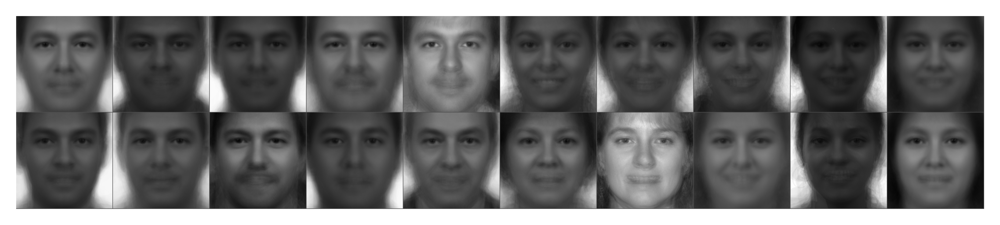

In [7]:
nPicture = 1
nClusterColumns = K // td.C
img = np.zeros ([K*(height+1) // nClusterColumns, nClusterColumns * td.C // nPicture * (width+1) , 3])
nRows = K // nClusterColumns
for c in range(td.C):
    for k in range (td.Ki[c]):
        idx1 = (k % nRows)*(height+1) 
        idx2 = (c * nClusterColumns+ k // nRows) * (width+1)
        img[idx1:idx1+height, idx2:idx2+width, 0] = td.subclassMeans[c,k].reshape ([height,width])
        img[idx1:idx1+height, idx2:idx2+width, 1] = img[idx1:idx1+height, idx2:idx2+width, 0]
        img[idx1:idx1+height, idx2:idx2+width, 2] = img[idx1:idx1+height, idx2:idx2+width, 0]
plt.axis ('off')
#plt.subplots_adjust(left=0, bottom=0, right=1, top=1, wspace=0, hspace=0)
plt.tight_layout(pad=0)
img = img - np.min(img)
img /= np.max(img)
plt.imshow(img)    
fn = 'feret_clustering_faces' + str((1)) + '.png'
plt.imsave(fn, img)
plt.show()

In [8]:
def performExperiment (solver, reg):
    print ('solver = ', solver)
    lda = LinearDiscriminantAnalysis(td, solver, 'Sb', 'St', reg, 0.001)
    
    start = time.time()
    lda.fitFeatureExtractor()
    end = time.time()
    print ('lda.fitFeatureExtractor took time: ', end - start)
    
    objective = lda.objective()
    print('Objective: ' , objective)
    return lda

In [9]:
def depictFeatureDetectors(lda, solver, reg, color):
    nClusterColumns = K // td.C
    nPictures = 1
    imgs = lda.GenerateImagesOfLinearFeatureExtractorWeights(width, height, 
                        color = color, nImages = nPicture, rows=K//nClusterColumns, cols = nClusterColumns * C // nPicture)
    for i, img in enumerate (imgs):
        plt.imshow (img)
        plt.axis('off')
        fn = 'feret_{}_reg{}_{}_faces'.format(solver,reg, color) + str((i+1)) + '.png'
        plt.imsave(fn, img)        
        plt.show()

In [10]:
solver = 'svd'
lda_svd = performExperiment (solver, reg)

solver =  svd
lda.fitFeatureExtractor took time:  17.40737533569336
Objective:  4.0932438704503555


In [11]:
solver = 'svd'

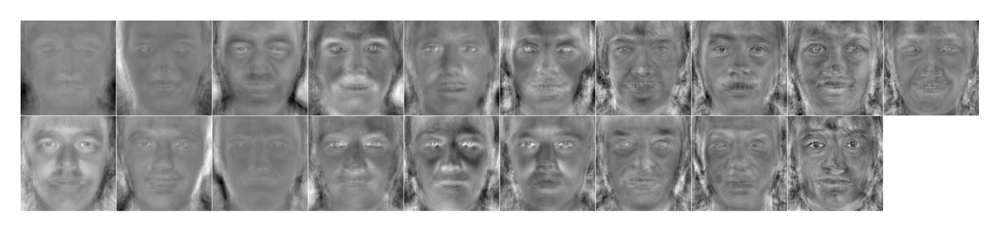

In [12]:
depictFeatureDetectors(lda_svd, solver, reg, 'gray')

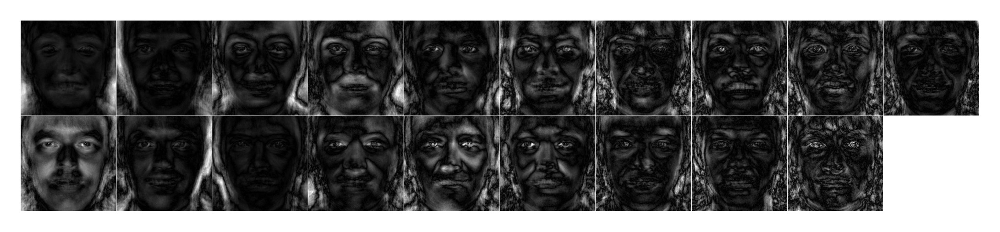

In [13]:
depictFeatureDetectors(lda_svd, solver, reg, 'gray_abs')

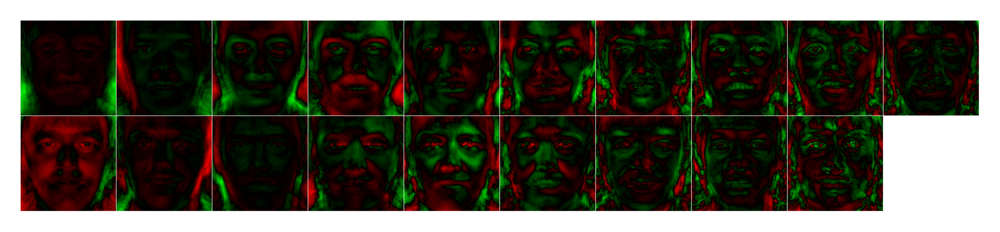

In [14]:
depictFeatureDetectors(lda_svd, solver, reg, 'color')

In [15]:
solver = 'ghiasi_svd'
lda_ghiasi_svd = performExperiment (solver, reg)

solver =  ghiasi_svd
lda.fitFeatureExtractor took time:  16.250952005386353
Objective:  4.09324387045035


In [16]:
solver = 'ghiasi_svd'

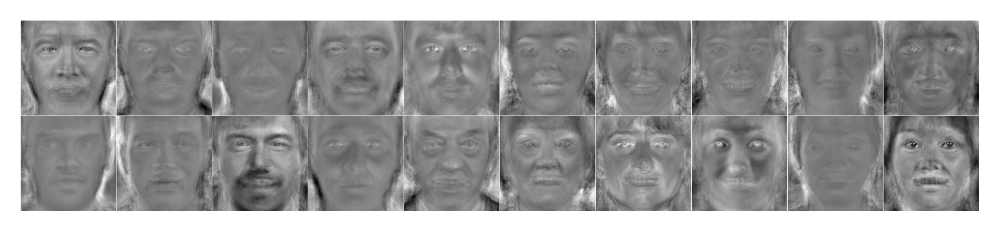

In [17]:
depictFeatureDetectors(lda_ghiasi_svd, solver, reg, 'gray')

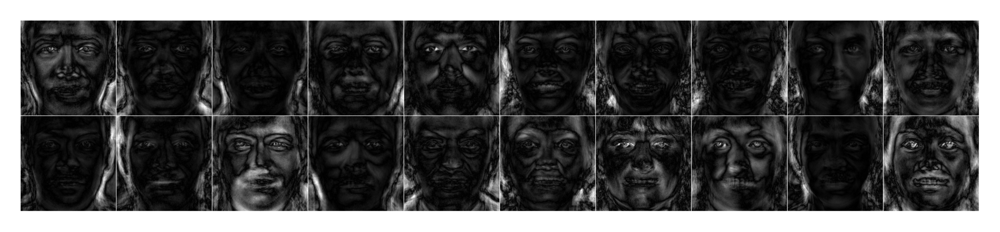

In [18]:
depictFeatureDetectors(lda_ghiasi_svd, solver, reg, 'gray_abs')

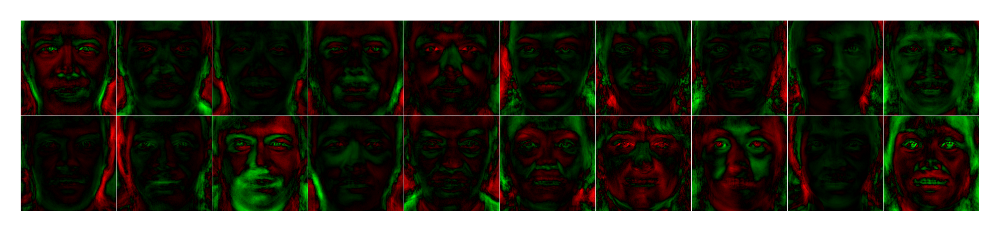

In [19]:
depictFeatureDetectors(lda_ghiasi_svd, solver, reg, 'color')

### <font color='red'> Author: Sayed Kamaledin Ghiasi-Shrirazi <a href="http://profsite.um.ac.ir/~k.ghiasi">(http://profsite.um.ac.ir/~k.ghiasi)</a> </font>